# Convolutional Neural Networks

## Project: Write an Algorithm for a Dog Identification App 

## Author: Sagarnil Das

---

---
### Why We're Here 

In this notebook, I will make the first steps towards developing an algorithm that could be used as part of a mobile or web app.  At the end of this project, my code will accept any user-supplied image as input.  If a dog is detected in the image, it will provide an estimate of the dog's breed.  If a human is detected, it will provide an estimate of the dog breed that is most resembling.  The image below displays potential sample output of my finished project (... but I expect that everyone's algorithm will behave differently!). 

![Sample Dog Output](images/sample_dog_output.png)

In this real-world setting, we will need to piece together a series of models to perform different tasks; for instance, the algorithm that detects humans in an image will be different from the CNN that infers dog breed.  There are many points of possible failure, and no perfect algorithm exists.  My imperfect solution will nonetheless create a fun user experience!

### The Road Ahead

I will break the notebook into separate steps.  Feel free to use the links below to navigate the notebook.

* [Step 0](#step0): Import Datasets
* [Step 1](#step1): Detect Humans
* [Step 2](#step2): Detect Dogs
* [Step 3](#step3): Create a CNN to Classify Dog Breeds (from Scratch)
* [Step 4](#step4): Use a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 5](#step5): Create a CNN to Classify Dog Breeds (using Transfer Learning)
* [Step 6](#step6): Write your Algorithm
* [Step 7](#step7): Test Your Algorithm

---
<a id='step0'></a>
## Step 0: Import Datasets

### Import Dog Dataset

In the code cell below, I import a dataset of dog images.  I populate a few variables through the use of the `load_files` function from the scikit-learn library:
- `train_files`, `valid_files`, `test_files` - numpy arrays containing file paths to images
- `train_targets`, `valid_targets`, `test_targets` - numpy arrays containing onehot-encoded classification labels 
- `dog_names` - list of string-valued dog breed names for translating labels

In [1]:
from sklearn.datasets import load_files       
from keras.utils import np_utils
import numpy as np
from glob import glob

# define function to load train, test, and validation datasets
def load_dataset(path):
    data = load_files(path)
    dog_files = np.array(data['filenames'])
    dog_targets = np_utils.to_categorical(np.array(data['target']), 133)
    return dog_files, dog_targets

# load train, test, and validation datasets
train_files, train_targets = load_dataset('dogImages/train')
valid_files, valid_targets = load_dataset('dogImages/valid')
test_files, test_targets = load_dataset('dogImages/test')

# load list of dog names
dog_names = [item[20:-1] for item in sorted(glob("dogImages/train/*/"))]

# print statistics about the dataset
print('There are %d total dog categories.' % len(dog_names))
print('There are %s total dog images.\n' % len(np.hstack([train_files, valid_files, test_files])))
print('There are %d training dog images.' % len(train_files))
print('There are %d validation dog images.' % len(valid_files))
print('There are %d test dog images.'% len(test_files))

Using TensorFlow backend.


There are 133 total dog categories.
There are 8351 total dog images.

There are 6680 training dog images.
There are 835 validation dog images.
There are 836 test dog images.


### Import Human Dataset

In the code cell below, I will import a dataset of human images, where the file paths are stored in the numpy array `human_files`.

In [2]:
import random
random.seed(8675309)

# load filenames in shuffled human dataset
human_files = np.array(glob("lfw/*/*"))
random.shuffle(human_files)

# print statistics about the dataset
print('There are %d total human images.' % len(human_files))


There are 13233 total human images.


---
<a id='step1'></a>
## Step 1: Detect Humans

I will use OpenCV's implementation of [Haar feature-based cascade classifiers](http://docs.opencv.org/trunk/d7/d8b/tutorial_py_face_detection.html) to detect human faces in images.  OpenCV provides many pre-trained face detectors, stored as XML files on [github](https://github.com/opencv/opencv/tree/master/data/haarcascades).  I have downloaded one of these detectors and stored it in the `haarcascades` directory.

In the next code cell, I will demonstrate how to use this detector to find human faces in a sample image.

Number of faces detected: 1


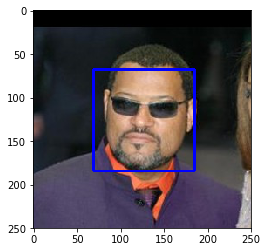

In [3]:
import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt.xml')

# load color (BGR) image
img = cv2.imread(human_files[3])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

Before using any of the face detectors, it is standard procedure to convert the images to grayscale.  The `detectMultiScale` function executes the classifier stored in `face_cascade` and takes the grayscale image as a parameter.  

In the above code, `faces` is a numpy array of detected faces, where each row corresponds to a detected face.  Each detected face is a 1D array with four entries that specifies the bounding box of the detected face.  The first two entries in the array (extracted in the above code as `x` and `y`) specify the horizontal and vertical positions of the top left corner of the bounding box.  The last two entries in the array (extracted here as `w` and `h`) specify the width and height of the box.

### Write a Human Face Detector

We can use this procedure to write a function that returns `True` if a human face is detected in an image and `False` otherwise.  This function, aptly named `face_detector`, takes a string-valued file path to an image as input and appears in the code block below.

In [4]:
# returns "True" if face is detected in image stored at img_path
def face_detector(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade.detectMultiScale(gray)
    return len(faces) > 0

### (IMPLEMENTATION) Assess the Human Face Detector

__Question 1:__ Use the code cell below to test the performance of the `face_detector` function.  
- What percentage of the first 100 images in `human_files` have a detected human face?  
- What percentage of the first 100 images in `dog_files` have a detected human face? 

Ideally, we would like 100% of human images with a detected face and 0% of dog images with a detected face.  We will see that our algorithm falls short of this goal, but still gives acceptable performance.  We extract the file paths for the first 100 images from each of the datasets and store them in the numpy arrays `human_files_short` and `dog_files_short`.

__Answer:__ 

In [5]:
human_files_short = human_files[:100]
dog_files_short = train_files[:100]
# Do NOT modify the code above this line.

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
human_faces = 0
dog_faces = 0

for human_path in human_files_short:
    if face_detector(human_path) == True:
        human_faces += 1
    
for dog_path in dog_files_short:
    if face_detector(dog_path) == True:
        dog_faces += 1
    
print("Percentage of the first 100 images in human_files which are detected as human face: " + str(human_faces))
print("Percentage of the first 100 images in dog_files which are detected as human face: " + str(dog_faces))


Percentage of the first 100 images in human_files which are detected as human face: 99
Percentage of the first 100 images in dog_files which are detected as human face: 11


__Question 2:__ This algorithmic choice necessitates that we communicate to the user that we accept human images only when they provide a clear view of a face (otherwise, we risk having unneccessarily frustrated users!). In your opinion, is this a reasonable expectation to pose on the user? If not, can you think of a way to detect humans in images that does not necessitate an image with a clearly presented face?

__Answer:__ No, it is not a reasonable expectation to pose on the users as we cannot expect them to always submit a clear view of their faces. The alternative idea is to use deep learning for feature extraction so that we can distinguish between humans and dogs even if their faces are not fully visible.

We suggest the face detector from OpenCV as a potential way to detect human images in your algorithm, but you are free to explore other approaches, especially approaches that make use of deep learning :).  Please use the code cell below to design and test your own face detection algorithm.  If you decide to pursue this _optional_ task, report performance on each of the datasets.

### Using Haarcascade_frontal_alt_tree algorithm

Number of faces detected: 1


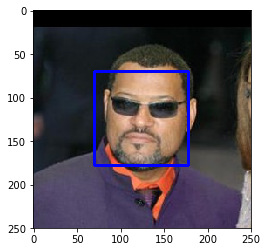

In [6]:
## (Optional) TODO: Report the performance of another  
## face detection algorithm on the LFW dataset
### Feel free to use as many code cells as needed.

# We will use the haarcascade_frontalface_alt_tree algorithm to check if there's any improvement in the performance

import cv2                
import matplotlib.pyplot as plt                        
%matplotlib inline                               

# extract pre-trained face detector
face_cascade_alt_tree = cv2.CascadeClassifier('haarcascades/haarcascade_frontalface_alt_tree.xml')

# load color (BGR) image
img = cv2.imread(human_files[3])
# convert BGR image to grayscale
gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

# find faces in image
faces = face_cascade_alt_tree.detectMultiScale(gray)

# print number of faces detected in the image
print('Number of faces detected:', len(faces))

# get bounding box for each detected face
for (x,y,w,h) in faces:
    # add bounding box to color image
    cv2.rectangle(img,(x,y),(x+w,y+h),(255,0,0),2)
    
# convert BGR image to RGB for plotting
cv_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

# display the image, along with bounding box
plt.imshow(cv_rgb)
plt.show()

In [7]:
# returns "True" if face is detected in image stored at img_path
def face_detector_alt_tree(img_path):
    img = cv2.imread(img_path)
    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)
    faces = face_cascade_alt_tree.detectMultiScale(gray)
    return len(faces) > 0

In [8]:
human_files_short = human_files[:100]
dog_files_short = train_files[:100]
# Do NOT modify the code above this line.

## TODO: Test the performance of the face_detector algorithm 
## on the images in human_files_short and dog_files_short.
human_faces = 0
dog_faces = 0

for human_path in human_files_short:
    if face_detector_alt_tree(human_path) == True:
        human_faces += 1
    
for dog_path in dog_files_short:
    if face_detector_alt_tree(dog_path) == True:
        dog_faces += 1
    
print("Percentage of the first 100 images in human_files which are detected as human face: " + str(human_faces))
print("Percentage of the first 100 images in dog_files which are detected as human face: " + str(dog_faces))


Percentage of the first 100 images in human_files which are detected as human face: 58
Percentage of the first 100 images in dog_files which are detected as human face: 0


So we see for this algorithm, even though there's no dogs which are classified as humans(which is a significant improvement), the numbers of human faces correctly detected went down by a lot.

---
<a id='step2'></a>
## Step 2: Detect Dogs

In this section, I will use a pre-trained [ResNet-50](http://ethereon.github.io/netscope/#/gist/db945b393d40bfa26006) model to detect dogs in images.  My first line of code downloads the ResNet-50 model, along with weights that have been trained on [ImageNet](http://www.image-net.org/), a very large, very popular dataset used for image classification and other vision tasks.  ImageNet contains over 10 million URLs, each linking to an image containing an object from one of [1000 categories](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a).  Given an image, this pre-trained ResNet-50 model returns a prediction (derived from the available categories in ImageNet) for the object that is contained in the image.

In [9]:
from keras.applications.resnet50 import ResNet50

# define ResNet50 model
ResNet50_model = ResNet50(weights='imagenet')

### Pre-process the Data

When using TensorFlow as backend, Keras CNNs require a 4D array (which we'll also refer to as a 4D tensor) as input, with shape

$$
(\text{nb_samples}, \text{rows}, \text{columns}, \text{channels}),
$$

where `nb_samples` corresponds to the total number of images (or samples), and `rows`, `columns`, and `channels` correspond to the number of rows, columns, and channels for each image, respectively.  

The `path_to_tensor` function below takes a string-valued file path to a color image as input and returns a 4D tensor suitable for supplying to a Keras CNN.  The function first loads the image and resizes it to a square image that is $224 \times 224$ pixels.  Next, the image is converted to an array, which is then resized to a 4D tensor.  In this case, since we are working with color images, each image has three channels.  Likewise, since we are processing a single image (or sample), the returned tensor will always have shape

$$
(1, 224, 224, 3).
$$

The `paths_to_tensor` function takes a numpy array of string-valued image paths as input and returns a 4D tensor with shape 

$$
(\text{nb_samples}, 224, 224, 3).
$$

Here, `nb_samples` is the number of samples, or number of images, in the supplied array of image paths.  It is best to think of `nb_samples` as the number of 3D tensors (where each 3D tensor corresponds to a different image) in our dataset!

In [10]:
from keras.preprocessing import image                  
from tqdm import tqdm

def path_to_tensor(img_path):
    # loads RGB image as PIL.Image.Image type
    img = image.load_img(img_path, target_size=(224, 224))
    # convert PIL.Image.Image type to 3D tensor with shape (224, 224, 3)
    x = image.img_to_array(img)
    # convert 3D tensor to 4D tensor with shape (1, 224, 224, 3) and return 4D tensor
    return np.expand_dims(x, axis=0)

def paths_to_tensor(img_paths):
    list_of_tensors = [path_to_tensor(img_path) for img_path in tqdm(img_paths)]
    return np.vstack(list_of_tensors)

### Making Predictions with ResNet-50

Getting the 4D tensor ready for ResNet-50, and for any other pre-trained model in Keras, requires some additional processing.  First, the RGB image is converted to BGR by reordering the channels.  All pre-trained models have the additional normalization step that the mean pixel (expressed in RGB as $[103.939, 116.779, 123.68]$ and calculated from all pixels in all images in ImageNet) must be subtracted from every pixel in each image.  This is implemented in the imported function `preprocess_input`.  If you're curious, you can check the code for `preprocess_input` [here](https://github.com/fchollet/keras/blob/master/keras/applications/imagenet_utils.py).

Now that I have a way to format my image for supplying to ResNet-50, I am now ready to use the model to extract the predictions.  This is accomplished with the `predict` method, which returns an array whose $i$-th entry is the model's predicted probability that the image belongs to the $i$-th ImageNet category.  This is implemented in the `ResNet50_predict_labels` function below.

By taking the argmax of the predicted probability vector, we obtain an integer corresponding to the model's predicted object class, which we can identify with an object category through the use of this [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a). 

In [11]:
from keras.applications.resnet50 import preprocess_input, decode_predictions

def ResNet50_predict_labels(img_path):
    # returns prediction vector for image located at img_path
    img = preprocess_input(path_to_tensor(img_path))
    return np.argmax(ResNet50_model.predict(img))

### Write a Dog Detector

While looking at the [dictionary](https://gist.github.com/yrevar/942d3a0ac09ec9e5eb3a), you will notice that the categories corresponding to dogs appear in an uninterrupted sequence and correspond to dictionary keys 151-268, inclusive, to include all categories from `'Chihuahua'` to `'Mexican hairless'`.  Thus, in order to check to see if an image is predicted to contain a dog by the pre-trained ResNet-50 model, I need to only check if the `ResNet50_predict_labels` function above returns a value between 151 and 268 (inclusive).

I will use these ideas to complete the `dog_detector` function below, which returns `True` if a dog is detected in an image (and `False` if not).

In [12]:
### returns "True" if a dog is detected in the image stored at img_path
def dog_detector(img_path):
    prediction = ResNet50_predict_labels(img_path)
    return ((prediction <= 268) & (prediction >= 151)) 

### (IMPLEMENTATION) Assess the Dog Detector

__Question 3:__ Use the code cell below to test the performance of your `dog_detector` function.  
- What percentage of the images in `human_files_short` have a detected dog?  
- What percentage of the images in `dog_files_short` have a detected dog?

__Answer:__ 

In [13]:
### TODO: Test the performance of the dog_detector function
### on the images in human_files_short and dog_files_short.

human_faces = 0
dog_faces = 0

for human_path in human_files_short:
    if dog_detector(human_path) == True:
        human_faces += 1
        
for dog_path in dog_files_short:
    if dog_detector(dog_path) == True:
        dog_faces += 1
  
print("Percentage of the first 100 images in human_files which are detected as dog face: " + str(human_faces))
print("Percentage of the first 100 images in dog_files which are detected as dog face: " + str(dog_faces))


Percentage of the first 100 images in human_files which are detected as dog face: 1
Percentage of the first 100 images in dog_files which are detected as dog face: 100


---
<a id='step3'></a>
## Step 3: Create a CNN to Classify Dog Breeds (from Scratch)

Now that I have functions for detecting humans and dogs in images, I need a way to predict breed from images.  In this step, I will create a CNN that classifies dog breeds.  I will create my CNN _from scratch_ (so, I can't use transfer learning _yet_!), and I must attain a test accuracy of at least 1%.  In Step 5 of this notebook, we will have the opportunity to use transfer learning to create a CNN that attains greatly improved accuracy.

Be careful with adding too many trainable layers!  More parameters means longer training, which means we are more likely to need a GPU to accelerate the training process.  Thankfully, Keras provides a handy estimate of the time that each epoch is likely to take; we can extrapolate this estimate to figure out how long it will take for our algorithm to train. 

We mention that the task of assigning breed to dogs from images is considered exceptionally challenging.  To see why, consider that *even a human* would have great difficulty in distinguishing between a Brittany and a Welsh Springer Spaniel.  

Brittany | Welsh Springer Spaniel
- | - 
<img src="images/Brittany_02625.jpg" width="100"> | <img src="images/Welsh_springer_spaniel_08203.jpg" width="200">

It is not difficult to find other dog breed pairs with minimal inter-class variation (for instance, Curly-Coated Retrievers and American Water Spaniels).  

Curly-Coated Retriever | American Water Spaniel
- | -
<img src="images/Curly-coated_retriever_03896.jpg" width="200"> | <img src="images/American_water_spaniel_00648.jpg" width="200">


Likewise, recall that labradors come in yellow, chocolate, and black.  Your vision-based algorithm will have to conquer this high intra-class variation to determine how to classify all of these different shades as the same breed.  

Yellow Labrador | Chocolate Labrador | Black Labrador
- | -
<img src="images/Labrador_retriever_06457.jpg" width="150"> | <img src="images/Labrador_retriever_06455.jpg" width="240"> | <img src="images/Labrador_retriever_06449.jpg" width="220">

We also mention that random chance presents an exceptionally low bar: setting aside the fact that the classes are slightly imabalanced, a random guess will provide a correct answer roughly 1 in 133 times, which corresponds to an accuracy of less than 1%.  


### Pre-process the Data

I will rescale the images by dividing every pixel in every image by 255.

In [14]:
from PIL import ImageFile                            
ImageFile.LOAD_TRUNCATED_IMAGES = True                 

# pre-process the data for Keras
train_tensors = paths_to_tensor(train_files).astype('float32')/255
valid_tensors = paths_to_tensor(valid_files).astype('float32')/255
test_tensors = paths_to_tensor(test_files).astype('float32')/255

100%|████████████████████████████████████████████████████████████████████████████████| 836/836 [01:11<00:00, 11.71it/s]


### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  At the end of our code cell block, we will summarize the layers of the model by executing the line:
    
        model.summary()

We have imported some Python modules to get you started, but feel free to import as many modules as you need.  If you end up getting stuck, here's a hint that specifies a model that trains relatively fast on CPU and attains >1% test accuracy in 5 epochs:

![Sample CNN](images/sample_cnn.png)
           
__Question 4:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  If you chose to use the hinted architecture above, describe why you think that CNN architecture should work well for the image classification task.

__Answer:__ Recall that any image is interpreted by the computer as a 3D array. Color images have some height and width and pixels along with red, green and blue channel corresponding to a depth of 3. Convolutional layers will be used to make this array deeper as it passes through the network and Maxpooling layers will be used to decrease the spatial dimension. The number of filters in a convolutional layer controls the depth of our convolutional layers since the layer has one activation map for each filter. Often we will have the number of filters slowly increase in the sequence. So the first layer might have 16 filters, the 2nd one will have 32, the 3rd one will have 64 and so on. Of course for the first convolutional layer, we will have to add an additional parameter of input_shape. As we have 224 x 224 color images, the input_shape will be (224,224,3) where 3 corresponds to the depth of the image (3 in this case). This will result in an increasing depth as we move deeper inside our layers. 

But we also have to decrease the width and the height. This is where MaxPooling layer comes in. Recall that MaxPooling layer place the filter in each position within the matrix and take only the maximum value inside the sub matrix. So this will result in a gradually decreasing width and height. We will use the most common setting for filters with size=2 and stride=2. This has the effect of making the spatial dimensions half of what they were from the previous layer. In this way, the combination of convolutional and maxpooling layers accomplishes our goal of attaining an array that is quite deep with very small spatial dimensions.

This sequence of layers discovers the spatial patterns contained in an image. It gradually takes the spatial data and converts the array to a representation that instead encodes the content of the image where all the spatial information is eventually lost. Once we get to a representation where there is no more spatial information left to discover in the image, we can flatten the array to a vector and feed it to one or more fully connected layers to perform the final recognition. Here we use 2 fully connected layers. In all the layers, we use 'relu' as an activation function except the last fully connected layer where we use a 'softmax' activation to convert the numbers into probabilities. We use couple of additional 'dropout' layers to reduce overfitting. The dropout layers randomly makes a certain percentage of nodes inactive while the propagation occurs. This ensures that all nodes are fully functional and not a few nodes doing all the heavy lifting.

After we have defined our model, we will also use image augmentation to improve the accuracy even more.

In [15]:
from keras.layers import Conv2D, MaxPooling2D, GlobalAveragePooling2D
from keras.layers import Dropout, Flatten, Dense
from keras.models import Sequential

model = Sequential()

### TODO: Define your architecture.
#adding the first convolutional layer with 16 filters in order to increase the depth
model.add(Conv2D(filters=16, kernel_size=2, padding='same', subsample=(2,2), activation='relu', input_shape=(224,224,3)))
#adding first MaxPooling layer to reduce width and height
model.add(MaxPooling2D(pool_size=2))
#adding the 2nd convolutional layer with 32 filters to increase the depth even more
model.add(Conv2D(filters=32, kernel_size=2, padding='same', activation='relu'))
#adding the 2nd MaxPooling Layer to reduce the width and height even more
model.add(MaxPooling2D(pool_size=2))
#Adding another set of convolutional layer and a maxpooling layer to reduce the width and height and increase the depth further
model.add(Conv2D(filters=64, kernel_size=2, padding='same', activation='relu'))
model.add(MaxPooling2D(pool_size=2))
#Adding a dropout layer with 30% dropout to reduce overfitting
model.add(Dropout(0.3))
#Flattening the image to a vector to feed it to a densely connected layer
model.add(Flatten())
#Adding the first densely connected layer with 64 nodes
model.add(Dense(64, activation='relu'))
#Adding a 2nd dropout layer to reduce overfitting
model.add(Dropout(0.4))
#Adding the final densely connected layer with a softmax activation function to convert the numbers to probabilities
model.add(Dense(133, activation='softmax'))

model.summary()

C:\Anaconda3\envs\aind-dog\lib\site-packages\ipykernel\__main__.py:9: UserWarning: Update your `Conv2D` call to the Keras 2 API: `Conv2D(input_shape=(224, 224,..., padding="same", kernel_size=2, strides=(2, 2), activation="relu", filters=16)`


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
conv2d_1 (Conv2D)            (None, 112, 112, 16)      208       
_________________________________________________________________
max_pooling2d_2 (MaxPooling2 (None, 56, 56, 16)        0         
_________________________________________________________________
conv2d_2 (Conv2D)            (None, 56, 56, 32)        2080      
_________________________________________________________________
max_pooling2d_3 (MaxPooling2 (None, 28, 28, 32)        0         
_________________________________________________________________
conv2d_3 (Conv2D)            (None, 28, 28, 64)        8256      
_________________________________________________________________
max_pooling2d_4 (MaxPooling2 (None, 14, 14, 64)        0         
_________________________________________________________________
dropout_1 (Dropout)          (None, 14, 14, 64)        0         
__________

### Compile the Model

In [16]:
model.compile(optimizer='rmsprop', loss='categorical_crossentropy', metrics=['accuracy'])

### (IMPLEMENTATION) Train the Model

I will train our model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

### Augmenting the image

In [17]:
from keras.preprocessing.image import ImageDataGenerator

#Augmenting the image
datagen = ImageDataGenerator(width_shift_range=0.2, 
                             height_shift_range=0.2,
                             rotation_range=40,
                             shear_range=0.2,
                             zoom_range=0.2,
                             fill_mode='nearest',
                             horizontal_flip=True)

datagen.fit(train_tensors)

### Visualize original and augmented images

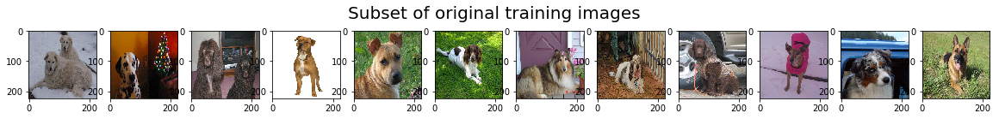

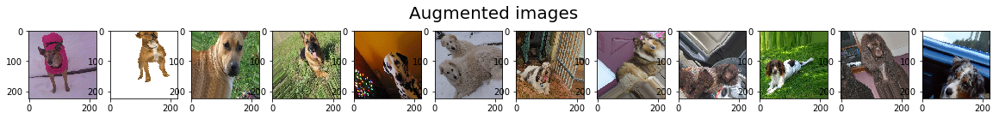

In [18]:
import matplotlib.pyplot as plt

#take subset of training data
train_tensors_subset = train_tensors[:12]

#visualize subset of training data
fig = plt.figure(figsize=(20,2))
for i in range(0, len(train_tensors_subset)):
    ax = fig.add_subplot(1,12,i+1)
    ax.imshow(train_tensors_subset[i])
fig.suptitle('Subset of original training images', fontsize=20)

#Visualize augmented images
fig = plt.figure(figsize=(20,2))
for x_batch in datagen.flow(train_tensors_subset, batch_size=12):
    for i in range(0,12):      
        ax = fig.add_subplot(1,12,i+1)
        ax.imshow(x_batch[i])
    fig.suptitle('Augmented images', fontsize=20)
    plt.show()
    break;


In [20]:
from keras.callbacks import ModelCheckpoint  

### TODO: specify the number of epochs that you would like to use to train the model.
batch_size = 20
epochs = 10

### Do NOT modify the code below this line.

checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.from_scratch.hdf5', 
                               verbose=1, save_best_only=True)

#model.fit(train_tensors, train_targets, 
#          validation_data=(valid_tensors, valid_targets),
#          epochs=epochs, batch_size=20, callbacks=[checkpointer], verbose=2)

model.fit_generator(datagen.flow(train_tensors, train_targets, batch_size=batch_size),
                   steps_per_epoch = train_tensors.shape[0]//batch_size, epochs=epochs,
                   verbose=2, callbacks=[checkpointer],
                   validation_data=(valid_tensors, valid_targets))

Epoch 1/10
Epoch 00000: val_loss improved from inf to 4.70549, saving model to saved_models/weights.best.from_scratch.hdf5
221s - loss: 4.7956 - acc: 0.0175 - val_loss: 4.7055 - val_acc: 0.0275
Epoch 2/10
Epoch 00001: val_loss improved from 4.70549 to 4.51364, saving model to saved_models/weights.best.from_scratch.hdf5
304s - loss: 4.6903 - acc: 0.0244 - val_loss: 4.5136 - val_acc: 0.0395
Epoch 3/10
Epoch 00002: val_loss improved from 4.51364 to 4.41869, saving model to saved_models/weights.best.from_scratch.hdf5
204s - loss: 4.5862 - acc: 0.0308 - val_loss: 4.4187 - val_acc: 0.0383
Epoch 4/10
Epoch 00003: val_loss improved from 4.41869 to 4.36720, saving model to saved_models/weights.best.from_scratch.hdf5
236s - loss: 4.5204 - acc: 0.0304 - val_loss: 4.3672 - val_acc: 0.0479
Epoch 5/10
Epoch 00004: val_loss improved from 4.36720 to 4.33741, saving model to saved_models/weights.best.from_scratch.hdf5
316s - loss: 4.4800 - acc: 0.0371 - val_loss: 4.3374 - val_acc: 0.0563
Epoch 6/10
Epo

### Load the Model with the Best Validation Loss

In [21]:
model.load_weights('saved_models/weights.best.from_scratch.hdf5')

### Test the Model

Try out your model on the test dataset of dog images.  Ensure that your test accuracy is greater than 1%.

In [22]:
# get index of predicted dog breed for each image in test set
dog_breed_predictions = [np.argmax(model.predict(np.expand_dims(tensor, axis=0))) for tensor in test_tensors]

# report test accuracy
test_accuracy = 100*np.sum(np.array(dog_breed_predictions)==np.argmax(test_targets, axis=1))/len(dog_breed_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 6.2201%


---
<a id='step4'></a>
## Step 4: Use a CNN to Classify Dog Breeds

To reduce training time without sacrificing accuracy, I will show how to train a CNN using transfer learning.  In the following step, we will get a chance to use transfer learning to train our own CNN.

### Obtain Bottleneck Features

In [23]:
bottleneck_features = np.load('bottleneck_features/DogVGG16Data.npz')
train_VGG16 = bottleneck_features['train']
valid_VGG16 = bottleneck_features['valid']
test_VGG16 = bottleneck_features['test']

### Model Architecture

The model uses the the pre-trained VGG-16 model as a fixed feature extractor, where the last convolutional output of VGG-16 is fed as input to my model.  I will only add a global average pooling layer and a fully connected layer, where the latter contains one node for each dog category and is equipped with a softmax.

In [24]:
VGG16_model = Sequential()
VGG16_model.add(GlobalAveragePooling2D(input_shape=train_VGG16.shape[1:]))
VGG16_model.add(Dense(133, activation='softmax'))

VGG16_model.summary()

_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_1 ( (None, 512)               0         
_________________________________________________________________
dense_3 (Dense)              (None, 133)               68229     
Total params: 68,229.0
Trainable params: 68,229.0
Non-trainable params: 0.0
_________________________________________________________________


### Compile the Model

In [25]:
VGG16_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])

### Train the Model

In [26]:
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.VGG16.hdf5', 
                               verbose=1, save_best_only=True)

VGG16_model.fit(train_VGG16, train_targets, 
          validation_data=(valid_VGG16, valid_targets),
          epochs=20, batch_size=20, callbacks=[checkpointer], verbose=2)

Train on 6680 samples, validate on 835 samples
Epoch 1/20
Epoch 00000: val_loss improved from inf to 11.03842, saving model to saved_models/weights.best.VGG16.hdf5
6s - loss: 12.6095 - acc: 0.1139 - val_loss: 11.0384 - val_acc: 0.1976
Epoch 2/20
Epoch 00001: val_loss improved from 11.03842 to 10.35062, saving model to saved_models/weights.best.VGG16.hdf5
5s - loss: 10.4043 - acc: 0.2704 - val_loss: 10.3506 - val_acc: 0.2826
Epoch 3/20
Epoch 00002: val_loss improved from 10.35062 to 10.18104, saving model to saved_models/weights.best.VGG16.hdf5
6s - loss: 9.9867 - acc: 0.3302 - val_loss: 10.1810 - val_acc: 0.2898
Epoch 4/20
Epoch 00003: val_loss improved from 10.18104 to 9.83935, saving model to saved_models/weights.best.VGG16.hdf5
5s - loss: 9.6741 - acc: 0.3576 - val_loss: 9.8393 - val_acc: 0.3269
Epoch 5/20
Epoch 00004: val_loss improved from 9.83935 to 9.59893, saving model to saved_models/weights.best.VGG16.hdf5
3s - loss: 9.3925 - acc: 0.3781 - val_loss: 9.5989 - val_acc: 0.3413
E

### Load the Model with the Best Validation Loss

In [27]:
VGG16_model.load_weights('saved_models/weights.best.VGG16.hdf5')

### Test the Model

Now, I can use the CNN to test how well it identifies breed within our test dataset of dog images.  I will print the test accuracy below.

In [28]:
# get index of predicted dog breed for each image in test set
VGG16_predictions = [np.argmax(VGG16_model.predict(np.expand_dims(feature, axis=0))) for feature in test_VGG16]

# report test accuracy
test_accuracy = 100*np.sum(np.array(VGG16_predictions)==np.argmax(test_targets, axis=1))/len(VGG16_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 42.1053%


### Predict Dog Breed with the Model

In [29]:
from extract_bottleneck_features import *

def VGG16_predict_breed(img_path):
    # extract bottleneck features
    bottleneck_feature = extract_VGG16(path_to_tensor(img_path))
    # obtain predicted vector
    predicted_vector = VGG16_model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return dog_names[np.argmax(predicted_vector)]

---
<a id='step5'></a>
## Step 5: Create a CNN to Classify Dog Breeds (using Transfer Learning)

I will now use transfer learning to create a CNN that can identify dog breed from images.  My CNN must attain at least 60% accuracy on the test set.

In Step 4, we used transfer learning to create a CNN using VGG-16 bottleneck features.  In this section, we must use the bottleneck features from a different pre-trained model.  To make things easier for you, we have pre-computed the features for all of the networks that are currently available in Keras:
- [VGG-19](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogVGG19Data.npz) bottleneck features
- [ResNet-50](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogResnet50Data.npz) bottleneck features
- [Inception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogInceptionV3Data.npz) bottleneck features
- [Xception](https://s3-us-west-1.amazonaws.com/udacity-aind/dog-project/DogXceptionData.npz) bottleneck features

The files are encoded as such:

    Dog{network}Data.npz
    
where `{network}`, in the above filename, can be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.  Pick one of the above architectures, download the corresponding bottleneck features, and store the downloaded file in the `bottleneck_features/` folder in the repository.

### (IMPLEMENTATION) Obtain Bottleneck Features

In the code block below, extract the bottleneck features corresponding to the train, test, and validation sets by running the following:

    bottleneck_features = np.load('bottleneck_features/Dog{network}Data.npz')
    train_{network} = bottleneck_features['train']
    valid_{network} = bottleneck_features['valid']
    test_{network} = bottleneck_features['test']

In [30]:
### TODO: Obtain bottleneck features from another pre-trained CNN.

bottleneck_features = np.load('bottleneck_features/DogResnet50Data.npz')
train_resnet = bottleneck_features['train']
valid_resnet = bottleneck_features['valid']
test_resnet = bottleneck_features['test']

### (IMPLEMENTATION) Model Architecture

Create a CNN to classify dog breed.  At the end of our code cell block, I will summarize the layers of our model by executing the line:
    
        <your model's name>.summary()
   
__Question 5:__ Outline the steps you took to get to your final CNN architecture and your reasoning at each step.  Describe why you think the architecture is suitable for the current problem.

__Answer:__  I tested both the Resnet and the Inception model but discovered that the Resnet model works much better in predicting a dog's breed than the Inception model. Once I selected the model, I followed the steps with the VGG16 model above. I added a global average pooling layer and a dense layer with Softmax activation to classify the output into one of 133 categories. With this architecture Initially I was able to get 80% accuracy with a rmsprop optimizer. But when I used the Adagrad decaying optimizer, the accuracy jumped to 84%. I trained the model for 10 epochs. I picked the model with the lowest validation loss.


In [31]:
### TODO: Define your architecture.
resnet_model = Sequential()
resnet_model.add(GlobalAveragePooling2D(input_shape=train_resnet.shape[1:]))
resnet_model.add(Dense(133, activation='softmax'))

resnet_model.summary()


_________________________________________________________________
Layer (type)                 Output Shape              Param #   
global_average_pooling2d_2 ( (None, 2048)              0         
_________________________________________________________________
dense_4 (Dense)              (None, 133)               272517    
Total params: 272,517.0
Trainable params: 272,517.0
Non-trainable params: 0.0
_________________________________________________________________


### (IMPLEMENTATION) Compile the Model

In [32]:
### TODO: Compile the model.
#resnet_model.compile(loss='categorical_crossentropy', optimizer='rmsprop', metrics=['accuracy'])
resnet_model.compile(loss='categorical_crossentropy', optimizer='Adadelta', metrics=['accuracy'])

### (IMPLEMENTATION) Train the Model

Train your model in the code cell below.  Use model checkpointing to save the model that attains the best validation loss.  

You are welcome to [augment the training data](https://blog.keras.io/building-powerful-image-classification-models-using-very-little-data.html), but this is not a requirement. 

In [33]:
### TODO: Train the model.

#Train the model and save the one with the lowest validation loss
checkpointer = ModelCheckpoint(filepath='saved_models/weights.best.resnet.hdf5', 
                               verbose=2, save_best_only=True)

resnet_model.fit(train_resnet, train_targets, 
          validation_data=(valid_resnet, valid_targets),
          epochs=20, batch_size=20, callbacks=[checkpointer], verbose=2)



Train on 6680 samples, validate on 835 samples
Epoch 1/20
Epoch 00000: val_loss improved from inf to 1.40374, saving model to saved_models/weights.best.resnet.hdf5
9s - loss: 2.4672 - acc: 0.4714 - val_loss: 1.4037 - val_acc: 0.6946
Epoch 2/20
Epoch 00001: val_loss improved from 1.40374 to 0.95196, saving model to saved_models/weights.best.resnet.hdf5
8s - loss: 0.9171 - acc: 0.7985 - val_loss: 0.9520 - val_acc: 0.7605
Epoch 3/20
Epoch 00002: val_loss improved from 0.95196 to 0.78526, saving model to saved_models/weights.best.resnet.hdf5
3s - loss: 0.5866 - acc: 0.8695 - val_loss: 0.7853 - val_acc: 0.7713
Epoch 4/20
Epoch 00003: val_loss improved from 0.78526 to 0.69706, saving model to saved_models/weights.best.resnet.hdf5
3s - loss: 0.4326 - acc: 0.9040 - val_loss: 0.6971 - val_acc: 0.7952
Epoch 5/20
Epoch 00004: val_loss improved from 0.69706 to 0.64432, saving model to saved_models/weights.best.resnet.hdf5
3s - loss: 0.3436 - acc: 0.9208 - val_loss: 0.6443 - val_acc: 0.8096
Epoch 6

### (IMPLEMENTATION) Load the Model with the Best Validation Loss

In [34]:
### TODO: Load the model weights with the best validation loss.

resnet_model.load_weights('saved_models/weights.best.resnet.hdf5')

### (IMPLEMENTATION) Test the Model

I will try out my model on the test dataset of dog images. I will ensure that my test accuracy is greater than 60%.

In [35]:
### TODO: Calculate classification accuracy on the test dataset.
resnet_predictions = [np.argmax(resnet_model.predict(np.expand_dims(feature, axis=0))) for feature in test_resnet]

# report test accuracy
test_accuracy = 100*np.sum(np.array(resnet_predictions)==np.argmax(test_targets, axis=1))/len(resnet_predictions)
print('Test accuracy: %.4f%%' % test_accuracy)

Test accuracy: 83.3732%


### (IMPLEMENTATION) Predict Dog Breed with the Model

Now I will write a function that takes an image path as input and returns the dog breed (`Affenpinscher`, `Afghan_hound`, etc) that is predicted by my model.  

Similar to the analogous function in Step 5, my function will have three steps:
1. Extract the bottleneck features corresponding to the chosen CNN model.
2. Supply the bottleneck features as input to the model to return the predicted vector.  Note that the argmax of this prediction vector gives the index of the predicted dog breed.
3. Use the `dog_names` array defined in Step 0 of this notebook to return the corresponding breed.

The functions to extract the bottleneck features can be found in `extract_bottleneck_features.py`, and they have been imported in an earlier code cell.  To obtain the bottleneck features corresponding to our chosen CNN architecture, we need to use the function

    extract_{network}
    
where `{network}`, in the above filename, should be one of `VGG19`, `Resnet50`, `InceptionV3`, or `Xception`.

In [36]:
### TODO: Write a function that takes a path to an image as input
### and returns the dog breed that is predicted by the model.

from keras.preprocessing import image        
from extract_bottleneck_features import *

def dog_breed_predictor(img_path):
    # Extract the bottleneck features for Resnet CNN model
    bottleneck_feature = extract_Resnet50(path_to_tensor(img_path))
   
    #Load the best model
    resnet_model.load_weights('saved_models/weights.best.resnet.hdf5')
     # obtain predicted vector
    predicted_vector = resnet_model.predict(bottleneck_feature)
    # return dog breed that is predicted by the model
    return dog_names[np.argmax(predicted_vector)]


---
<a id='step6'></a>
## Step 6: Write your Algorithm

I will write an algorithm that accepts a file path to an image and first determines whether the image contains a human, dog, or neither.  Then,
- if a __dog__ is detected in the image, return the predicted breed.
- if a __human__ is detected in the image, return the resembling dog breed.
- if __neither__ is detected in the image, provide output that indicates an error.

You are welcome to write your own functions for detecting humans and dogs in images, but feel free to use the `face_detector` and `dog_detector` functions developed above.  You are __required__ to use your CNN from Step 5 to predict dog breed.  

Some sample output for our algorithm is provided below, but feel free to design your own user experience!

** Hello Human!.You resemble the dog breed: French Bulldog **

![Sample Human Output](images/my_image.jpg)


### (IMPLEMENTATION) Write your Algorithm

In [37]:
### TODO: Write your algorithm.
### Feel free to use as many code cells as needed.

from PIL import Image
import matplotlib.pyplot as plt
%matplotlib inline
import matplotlib.image as mpimg

def final_predictor(img_path):
    # Load the image
    img= mpimg.imread(img_path)
    plt.figure(figsize=(20,20))
    plt.imshow(img)
    
    # Use dog detector and dog_breed_predictor functions to detect dogs and predict their breed
    if dog_detector(img_path) == True:
        print("Hello Dog!.Your breed is:", dog_breed_predictor(img_path))
    elif dog_detector(img_path) == False:
         print("Hello Human!.You resemble the dog breed:", dog_breed_predictor(img_path))
    else:
        print("An error has occured")

---
<a id='step7'></a>
## Step 7: Test Your Algorithm

In this section, I will take my new algorithm for a spin!  What kind of dog does the algorithm think that __you__ look like?  If you have a dog, does it predict your dog's breed accurately?  If you have a cat, does it mistakenly think that your cat is a dog?

### (IMPLEMENTATION) Test the Algorithm on Sample Images!

Test our algorithm at least six images on our computer.  Feel free to use any images you like.  Use at least two human and two dog images.  

__Question 6:__ Is the output better than you expected :) ?  Or worse :( ?  Provide at least three possible points of improvement for your algorithm.

__Answer:__ The output of the model is really good at this point of time. It correctly classified 5 out of 5 dog breeds from images it has never seen before. That means it is giving me 100% accuracy at this moment for these pictures. This is better than I expected. Of course, there's still room for improvement. In my opinion, the following points can be explored for further improvements:

1. I noticed that some breeds of dogs has less training data than the others. So for those breeds, the model is not trained well enough as it is for the other breeds. So either we can add more training data for those breeds, or we can do image augmentation to further improve the accuracy.

2. We can explore different model architectures to further improve the accuracy of predictions.


Hello Dog!.Your breed is: Chihuahua
Hello Dog!.Your breed is: Doberman_pinscher
Hello Dog!.Your breed is: German_shepherd_dog
Hello Dog!.Your breed is: Italian_greyhound
Hello Dog!.Your breed is: Saint_bernard
Hello Human!.You resemble the dog breed: Dogue_de_bordeaux
Hello Human!.You resemble the dog breed: English_toy_spaniel
Hello Human!.You resemble the dog breed: Bullmastiff


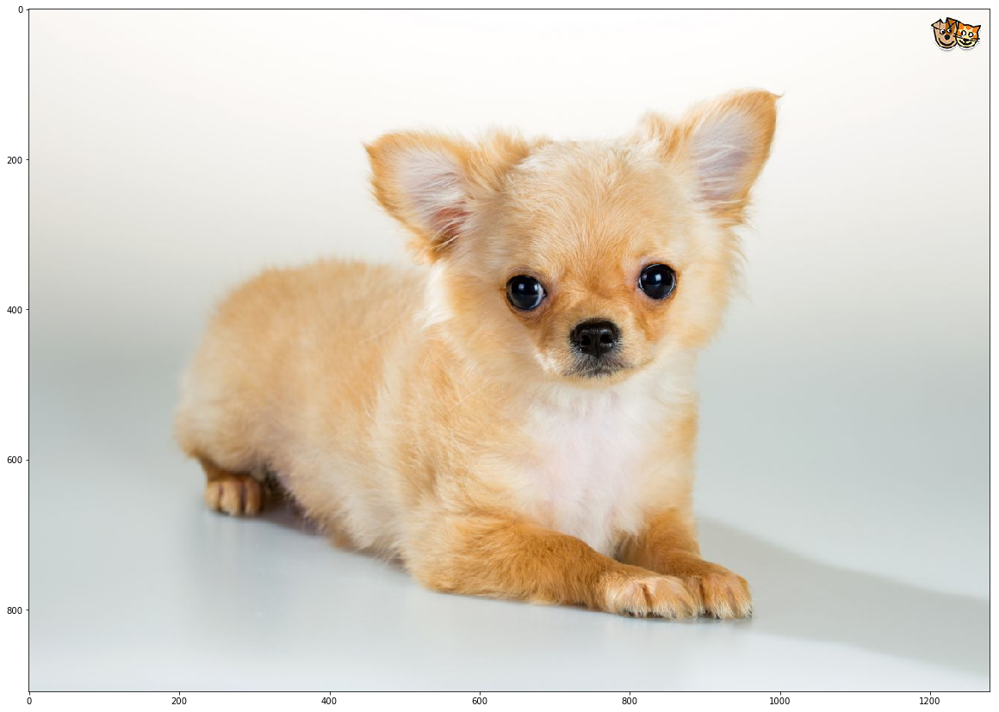

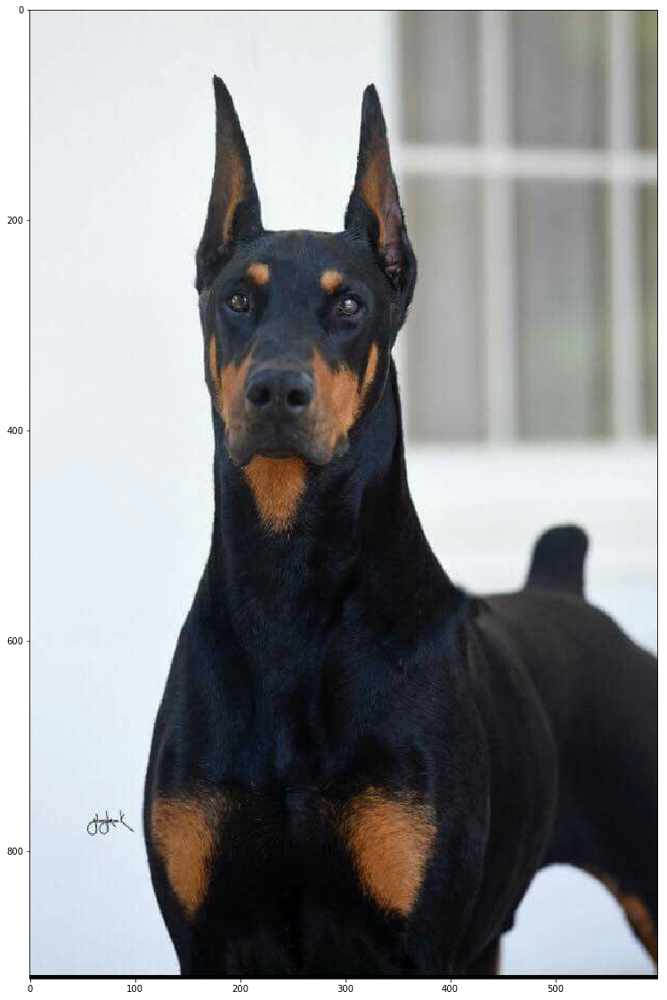

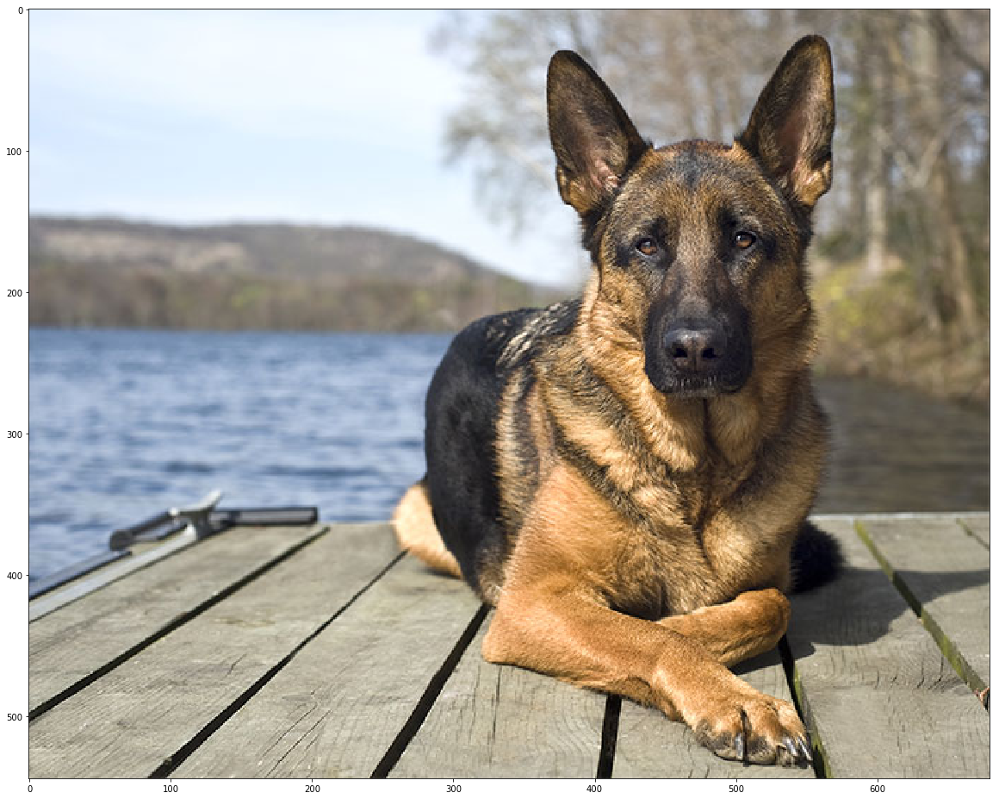

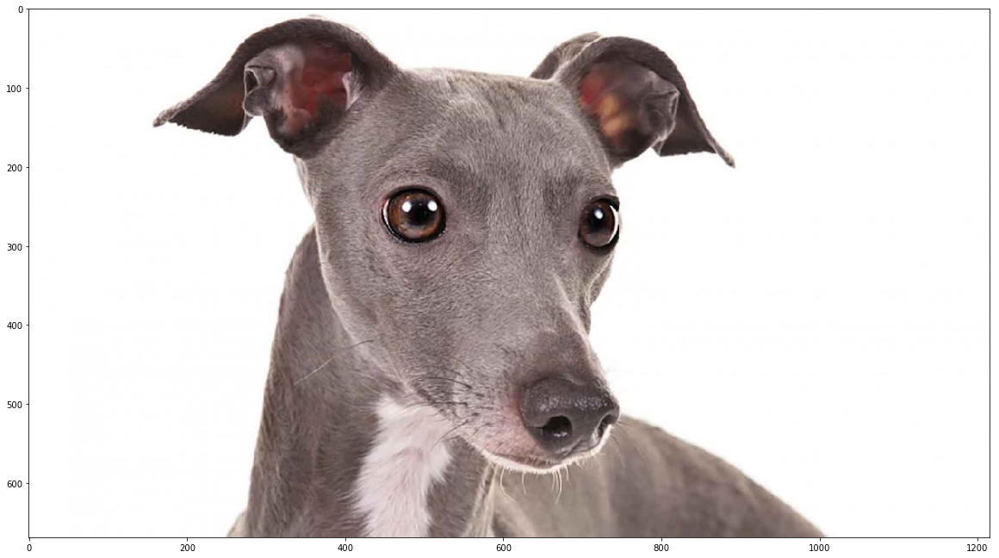

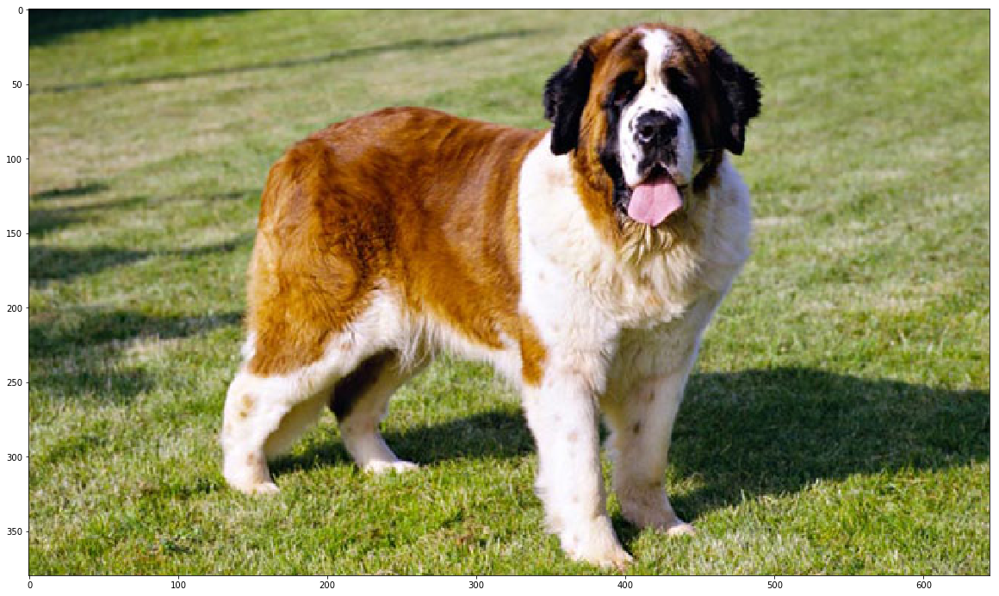

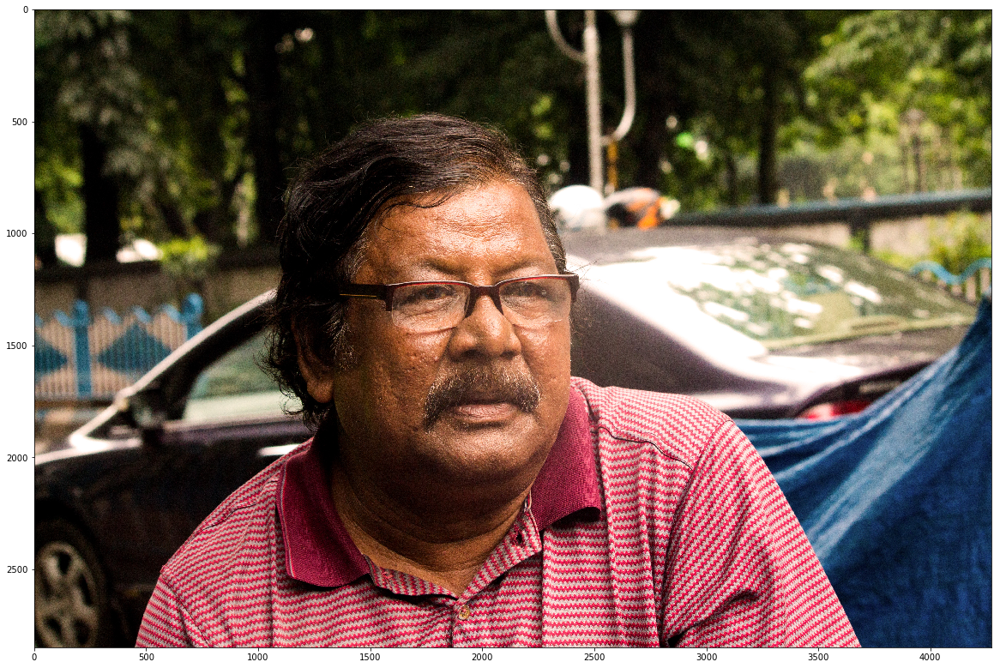

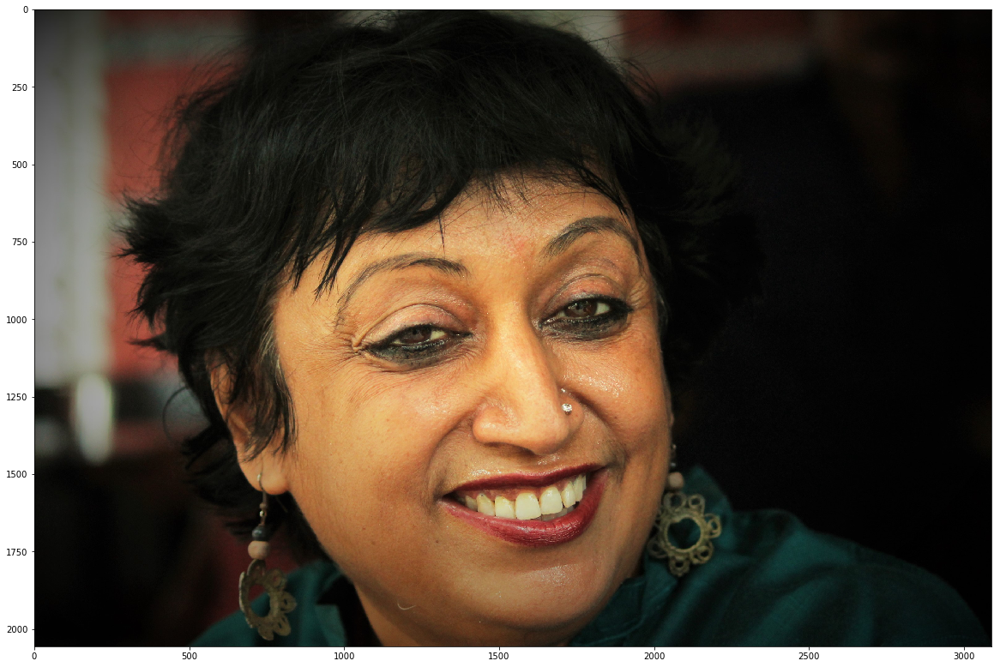

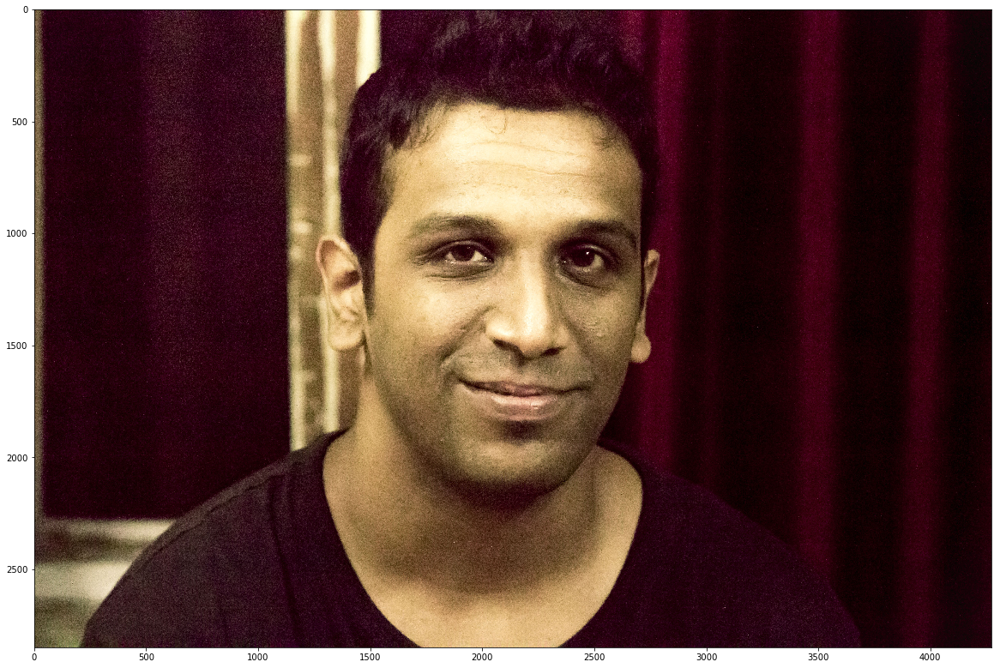

In [38]:
## TODO: Execute your algorithm from Step 6 on
## at least 6 images on your computer.
## Feel free to use as many code cells as needed.

for infile in sorted(glob("test_images/*")):
     final_predictor(infile)